Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pandas import DataFrame
import seaborn as sns
from pylab import rcParams
import scipy
from scipy.stats import pearsonr

from ipywidgets import interact
import ipywidgets as widgets

from datetime import datetime
pd.core.common.is_list_like = pd.api.types.is_list_like
import pandas_datareader.data as web

from chart_studio import plotly as ply
import plotly.graph_objs as go
import plotly.offline as offline

offline.init_notebook_mode(connected=True)

Importing our data

In [2]:
atmtrx=pd.read_csv("C:\\Users\\karol\\Downloads\\atmtrx\\ATM.csv")

In [3]:
#checking how large is the dataframe
atmtrx.shape

(11589, 10)

Description of the data set: Data comes from Kaggle website: https://www.kaggle.com/datasets/saadfareed/data-set-of-atm-transaction-of-xyz-bank It has 10 columns and 11589 rows. It contains ATMs transactions of XYZ cards and no XYZ cards from 2011 till 2016, value of this trancations and information which day of the week the withdrawal has been done. Transactions cames from five ATMs.The location was not changed from 2011 till 2016.

In [7]:
# checking the type of the variables
atmtrx.dtypes

atm_name                        object
transaction_date                object
No_Of_Withdrawals                int64
no_of_XYZ_card_withdrawals       int64
no_of_other_card_withdrawals     int64
total_amount_withdrawn           int64
amount_withdrawn_XYZ_card        int64
amount_withdrawn_other_card      int64
weekday                         object
working_day                     object
dtype: object

In [4]:
#checking first five rows of the dataset
atmtrx.head(5)

,atm_name,transaction_date,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals,total_amount_withdrawn,amount_withdrawn_XYZ_card,amount_withdrawn_other_card,weekday,working_day
0,Big Street ATM,01/01/2011,50,20,30,123800,41700,82100,saturday,H
1,Mount Road ATM,01/01/2011,253,67,186,767900,270900,497000,saturday,H
2,Airport ATM,01/01/2011,98,56,42,503400,347700,155700,saturday,H
3,KK Nagar ATM,01/01/2011,265,159,106,945300,532600,412700,saturday,H
4,Christ College ATM,01/01/2011,74,25,49,287700,148200,139500,saturday,H


In [5]:
#checking the last five rows of the dataset
atmtrx.tail(5)

,atm_name,transaction_date,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals,total_amount_withdrawn,amount_withdrawn_XYZ_card,amount_withdrawn_other_card,weekday,working_day
11584,Big Street ATM,29/09/2017,137,34,103,468800,146200,322600,friday,H
11585,Mount Road ATM,29/09/2017,79,27,52,305100,172500,132600,friday,H
11586,Airport ATM,29/09/2017,117,77,40,709900,576800,133100,friday,H
11587,KK Nagar ATM,29/09/2017,76,48,28,408700,279900,128800,friday,H
11588,Christ College ATM,29/09/2017,143,61,82,700400,364200,336200,friday,H


Dataset has three categorical variables:atm_name,weekday,working_day and six numerical variables: No_Of_Withdrawals which is the sum of two numerical variables no_of_XYZ_card_withdrawals and no_of_other_card_withdrawals. We have total_amount_withdrawn which is the sum of two numerical variables amount_withdrawn_XYZ_card and amount_withdrawn_other_card. There are also dates which we can work as date objects thanks to import a module named datetime.

## Cleaning data process - checking if it is necessary

In [6]:
# Missing values
# Get the number of missing values per column
missing_values=pd.DataFrame(atmtrx.isnull().any(),columns=(['Nulls']))
missing_values['Nan_count']=pd.DataFrame(atmtrx.isnull().sum())
missing_values['Nan_percentage']=round((atmtrx.isnull().mean()*100),2)
print(missing_values.sort_values(by='Nan_percentage',ascending=False))

                              Nulls  Nan_count  Nan_percentage
atm_name                      False          0             0.0
transaction_date              False          0             0.0
No_Of_Withdrawals             False          0             0.0
no_of_XYZ_card_withdrawals    False          0             0.0
no_of_other_card_withdrawals  False          0             0.0
total_amount_withdrawn        False          0             0.0
amount_withdrawn_XYZ_card     False          0             0.0
amount_withdrawn_other_card   False          0             0.0
weekday                       False          0             0.0
working_day                   False          0             0.0


In [11]:
# chcecking duplicates
atmtrx.duplicated().any()

False

There is no Nan's in the dataset and no duplicates.

## TimeSeries analysis of transactions numbers and their amount

In [ ]:
#TimeSeries  with plotly muliple traces
#Plot a graph of Total number of withdrawals 

In [7]:
trace_total = [go.Scatter(x=atmtrx['transaction_date'], 
                   y=atmtrx['No_Of_Withdrawals'],
                  line=dict(color='salmon'))]
layout=dict(xaxis=dict(tickangle = 80),title="Number of cash withdrawal transactions in total")
fig=dict(data=trace_total,
        layout=layout)

offline.iplot(fig)

In [8]:
# Multiple traces

trace_onustrx = go.Scatter(x=atmtrx['transaction_date'],
                        y=atmtrx['no_of_XYZ_card_withdrawals'],
                        
                        name = "Number of XYZ card withdrawal",
                        
                        line = dict(color = 'indianred')
                       )

In [9]:
trace_nonofus = go.Scatter(x=atmtrx['transaction_date'],
                       y=atmtrx['no_of_other_card_withdrawals'],
                       
                       name = "Number of not XYZ card withdrawal",
                       
                       line = dict(color = 'lightsalmon')
                      )

In [10]:
data=[trace_onustrx,trace_nonofus]
layout = dict(xaxis=dict(tickangle = 80),title = "Number of card withdrawal for XYZ card & no XYZ card")

In [11]:
fig = dict(data=[trace_onustrx,trace_nonofus], 
           layout=layout)


offline.iplot(fig)

From two above charts we can see that the total number of withdrawals had increasing tendancy between 2012 and 2014. What is more, transactions of not XYZ cards at this period are slightly higher however the increasing tendency we can observe in the number XYZ cards transactions. The question for buissnes units can be, what happened between 2012-2014 that more and more of XYZ withdrawals has been done? The the location of this ATMs hasn't change. Was it for example some special promo for XYZ card to do cash withdrawal? We see also decrasing tendency in total starting from 2015. What happen the end of November 2016? We can see total decline in transactions. After this, increasing tendency of not XYZ withdrawals, which for the first time since 2011 almost covers the numbers of XYZ card withdrawals.

Let's just take a look of amount of cash withdrawal

In [12]:
#Plot a graph of Total amount of withdrawals 

trace_total = [go.Scatter(x=atmtrx['transaction_date'], 
                   y=atmtrx['total_amount_withdrawn'],
                  line=dict(color='salmon'))]
layout=dict(xaxis=dict(tickangle = 80),title="Number of total amount of cash withdrawal")
fig=dict(data=trace_total,
        layout=layout)

offline.iplot(fig)

In [15]:
# Multiple traces

trace_onusamount = go.Scatter(x=atmtrx['transaction_date'],
                        y=atmtrx['amount_withdrawn_XYZ_card'],
                        
                        name = "Number of cash amount for XYZ card ",
                        
                        line = dict(color = 'indianred')
                       )

In [16]:
trace_nonofusamount = go.Scatter(x=atmtrx['transaction_date'],
                       y=atmtrx['amount_withdrawn_other_card'],
                       
                       name = "Number of cash amount for not XYZ card",
                       
                       line = dict(color = 'lightsalmon')
                      )

In [17]:
data=[trace_onusamount,trace_nonofusamount]
layout = dict(xaxis=dict(tickangle = 80),title = "Number of cash amount for XYZ card & no XYZ card")

In [18]:
fig = dict(data=[trace_onusamount,trace_nonofusamount], 
           layout=layout)


offline.iplot(fig)

We can observe the same trend as in case of transactions numbers. Increasing tendancy between 2012-2014 after decresing trend till the end 2016. After total decline in November 2016 and can noticed immediately incerasing tendancy, particulary for not XYZ cards. The amount of XYZ cash withdrawal is above amount for XYZ card till the 2016 after tendancy has changed. Obviously there is linear correlation between number of transaction and amount of cash withdrawal which will be checked later.

## Finding relationships in data

## Checking categorical data

In [19]:
atmtrx['atm_name'].value_counts()

KK Nagar ATM          2371
Christ College ATM    2355
Big Street ATM        2354
Mount Road ATM        2256
Airport ATM           2253
Name: atm_name, dtype: int64

In [20]:
#how many 'holiday' and 'working_day' appears
atmtrx['working_day'].value_counts()

W    6621
H    4968
Name: working_day, dtype: int64

In [21]:
#what id the % of proportion between working and holiday?
print(' Workday consists of', round(((atmtrx['working_day'].value_counts()[0])*100)/(atmtrx['working_day'].value_counts()[0]+atmtrx['working_day'].value_counts()[1]),2) ,'% of all other days.')

 Workday consists of 57.13 % of all other days.


In [22]:
#crosstab Weekday per ATM
pd.crosstab(atmtrx['weekday'],atmtrx['atm_name'])

atm_name,Airport ATM,Big Street ATM,Christ College ATM,KK Nagar ATM,Mount Road ATM
weekday,,,,,
friday,269,288,289,292,274
monday,285,295,297,299,282
saturday,323,334,335,338,319
sunday,529,549,540,541,527
thursday,275,289,290,292,274
tuesday,289,305,307,309,292
wednesday,283,294,297,300,288


In [23]:
pd.crosstab(atmtrx['working_day'],atmtrx['atm_name'])

atm_name,Airport ATM,Big Street ATM,Christ College ATM,KK Nagar ATM,Mount Road ATM
working_day,,,,,
H,970,1012,1003,1013,970
W,1283,1342,1352,1358,1286


In [24]:
atmtrx_cat=atmtrx[['atm_name','working_day','weekday']]
atmname_group=atmtrx_cat.groupby('atm_name')
atmname_group.describe()

working_day                  weekday                    
                         count unique top  freq   count unique     top freq
atm_name                                                                   
Airport ATM               2253      2   W  1283    2253      7  sunday  529
Big Street ATM            2354      2   W  1342    2354      7  sunday  549
Christ College ATM        2355      2   W  1352    2355      7  sunday  540
KK Nagar ATM              2371      2   W  1358    2371      7  sunday  541
Mount Road ATM            2256      2   W  1286    2256      7  sunday  527

We have got categocical data: atm_name (five diffrent ATMs), working_day(H,W), weekday(monday-sunday). All transactions are coming from five diffrent ATMs. We can noticed that almost half of the transactions is taking place on the weekend. Workdays ( Mon-Fri) consists of 57.13 % of all other days. Sunday is the best day of cash withdrawals for all five locations. This information might be useful in order to schedule service intervention for putting cash in the machine.

Distribution of number of trx ver weekday

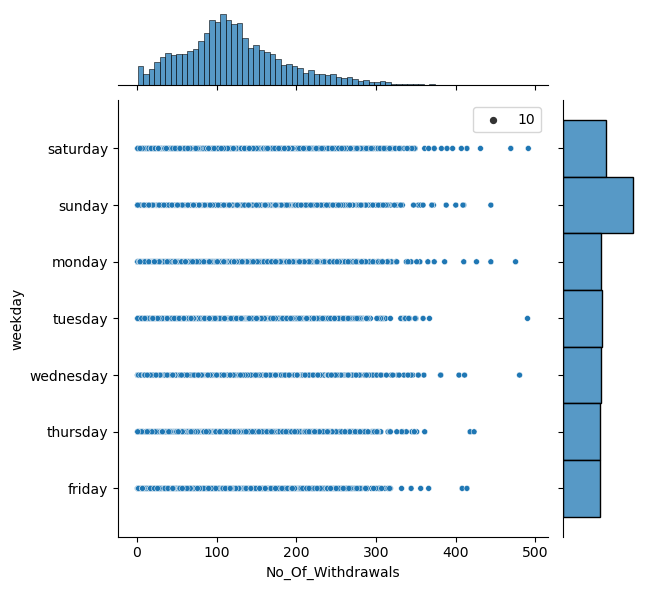

In [25]:
sns.jointplot(x='No_Of_Withdrawals', y='weekday', data=atmtrx, size=10)

We have got again confirmation on the graph that Sunday is day of cash withdrawal. It means that in the weekend machines are working as hard as in the week. Having this in mind, we can check  the data about when this ATMS are out of order to prevent it to be unavaiable especially in the weekend. What are the status of cash inside the machine before weekend?

In [26]:
#How many witdrawals was done on working day and Holiday?
atmtrx_group=atmtrx[['No_Of_Withdrawals'  ,'working_day','no_of_XYZ_card_withdrawals','no_of_other_card_withdrawals','weekday']]
atmname_group1=atmtrx_group.groupby('working_day')
atmname_group1.sum()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\3903462164.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals
working_day,,,
H,606092,322863,283229
W,823308,460179,363129


In [27]:
#stack bar chart1 with plotly
df=atmname_group1.sum()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\2758187846.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [28]:
trace1 = go.Bar(x=['H','W'],
                y=df['no_of_XYZ_card_withdrawals'],
                marker=dict(color='indianred'),
                name='no_of_XYZ_card_withdrawals')

trace2 = go.Bar(x=['H','W'],
                y=df['no_of_other_card_withdrawals'],
                marker=dict(color='lightsalmon'),
                name='no_of_other_card_withdrawals')

data = [trace1, trace2]

In [29]:
layout = go.Layout(barmode = 'stack',title = "Number of cash withdrawal for XYZ card & no XYZ card groupby workday")

In [30]:
fig = go.Figure(data = data, 
                layout = layout)

offline.iplot(fig)

Above bar chart proves again that most cash withdrawals takes place in the weekday (Mon-Fri) both for XYZ and no XYZ cards however holiday (Sat,Sun) are only slightly lower. 

In [31]:
#how many witdrawals was done per each day of the week?

atmname_group2=atmtrx_group.groupby('weekday')
atmname_group2.sum()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\3776913343.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals
weekday,,,
friday,167463,92382,75081
monday,181986,101032,80954
saturday,224705,122441,102264
sunday,311304,162960,148344
thursday,174770,96833,77937
tuesday,185715,104697,81018
wednesday,183457,102697,80760


In [32]:
#stack bar chart2 with plotly
df2=atmname_group2.sum()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\558693420.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [33]:
trace1 = go.Bar(x=['friday','monday','saturday','sunday','thursday','tuesday','wednesday'],
                y=df2['no_of_XYZ_card_withdrawals'],
                marker=dict(color='indianred'),
                name='no_of_XYZ_card_withdrawals')

trace2 = go.Bar(x=['friday','monday','saturday','sunday','thursday','tuesday','wednesday'],
                y=df2['no_of_other_card_withdrawals'],
                marker=dict(color='lightsalmon'),
                name='no_of_other_card_withdrawals'
)

data = [trace1, trace2]

In [34]:
layout = go.Layout(barmode = 'stack',title = "Number of cash withdrawal for XYZ card & no XYZ card groupby day")

In [35]:
fig = go.Figure(data = data, 
                layout = layout)

offline.iplot(fig)

As was said before Satruday and Sunday are days when ATMs in this five location working the most. Having more data we can try to analysis if lack of cash during the weekend doesn't accure, if all these ATMs are usually on-service. 

In [ ]:
#Inset plot for barchart (putting two above bar char in graph)

In [36]:
trace0 = go.Bar(x = ['friday','monday','saturday','sunday','thursday','tuesday','wednesday'],
                y = df2['No_Of_Withdrawals'],
                
                name = 'Number of cash withdrawals per weekday',
                marker=dict(color='indianred')
               )

In [37]:
trace1 = go.Bar(x=['H','W'],
                y=df2['No_Of_Withdrawals'],
              
                xaxis='x2',
                yaxis='y2',
              
                name='Number of cash withdrawals in working day(W) or holiday(H)',
                marker=dict(color='lightsalmon')
               )

In [38]:
data = [trace0, trace1]

In [39]:
layout = go.Layout(xaxis2 = dict(domain = [0.65, 0.9],
                                 anchor ='y2'),
                   
                   yaxis2 = dict(domain = [0.65, 0.95],
                                 anchor = 'x2')
                  )

In [40]:
fig = go.Figure(data=data, 
                layout=layout)

offline.iplot(fig)

## Checking relationship in numeric variables

VISUALISING LINEAR RELATIONSHIPS & BIVARIATE DISTRIBUTIONS (For distributions which vary randomly in two variables)

Let's us first look at the lmplot() function, a function in seaborn used to visualize a linear relationship as determined through regression. I will plot two variables in a single graph ('No_Of_Withdrawals','total_amount_withdrawn'). For this variables I will use the jointplot and regplot to show if the linear regression fit on the joint axes. After I will plot Hexbin plot and kernel density estimation. I will check also how it looks like for XYZ and no XYZ cards and how this relationship varies by the ATM name, working day or weekday.

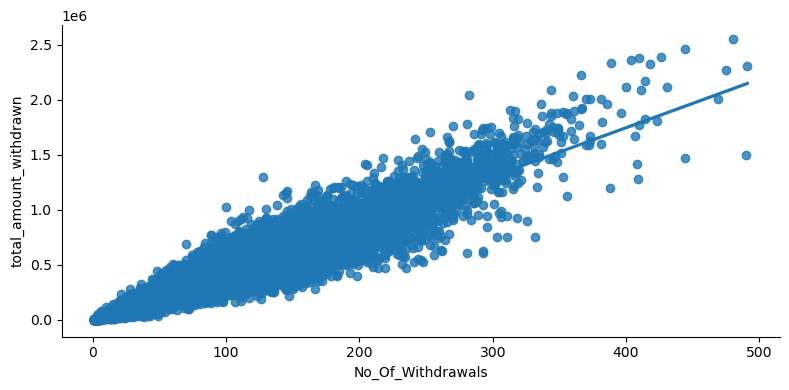

In [41]:
sns.lmplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, height=4, aspect=2);

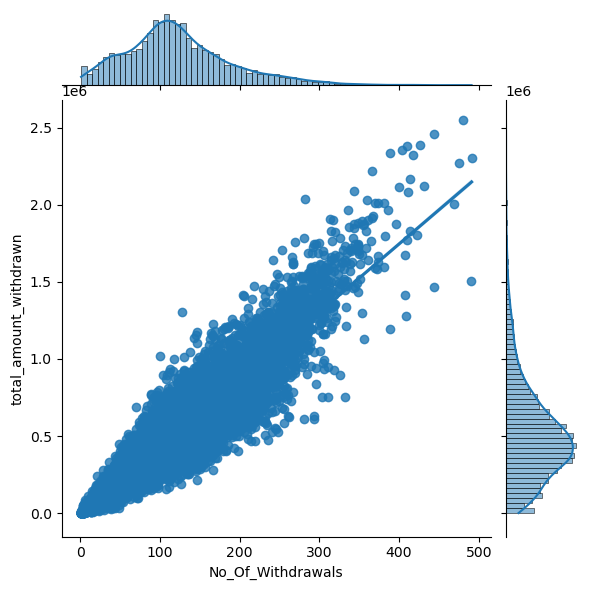

In [46]:
sns.jointplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, kind="reg");

From the regression plot, the transaction number seems to have direct relationship with the transaction amount. From the plot, we observe that:
-The lmplot draws a scatter plot of the input variables
-The functions fit the regression model y~x
-The regression line is plotted

Adding a hex type to the plot. A Hexbin plot is the bivariate analogue of a histogram. The color 'white' is used to specify background colour.

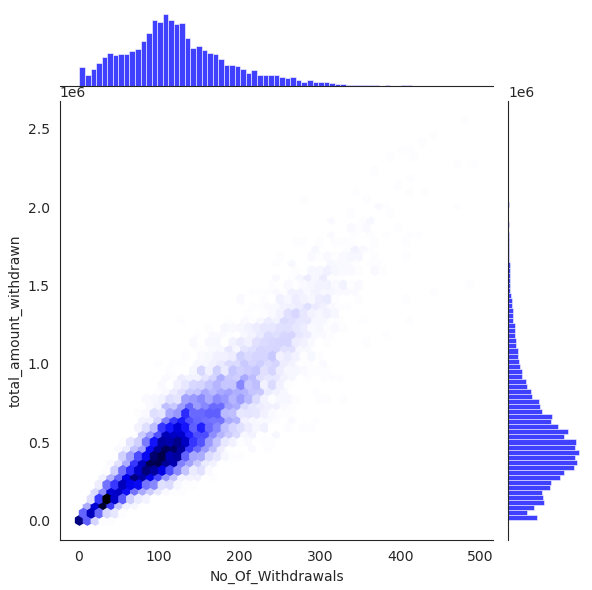

In [50]:
with sns.axes_style('white'):
    sns.jointplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, 
                  kind='hex',color='b');

We see the histograms of the individual plots on the right side and top side of the plot. Observing from that, the cross section where the peaks of the two histograms are present are the darkest regions of our hexbin plot. Many samples have a number of transaction about 90-150, and correspondingly, the total amount is in the range of around 500000-800000.

How about Kernel density estimation for bivariate distributions? 

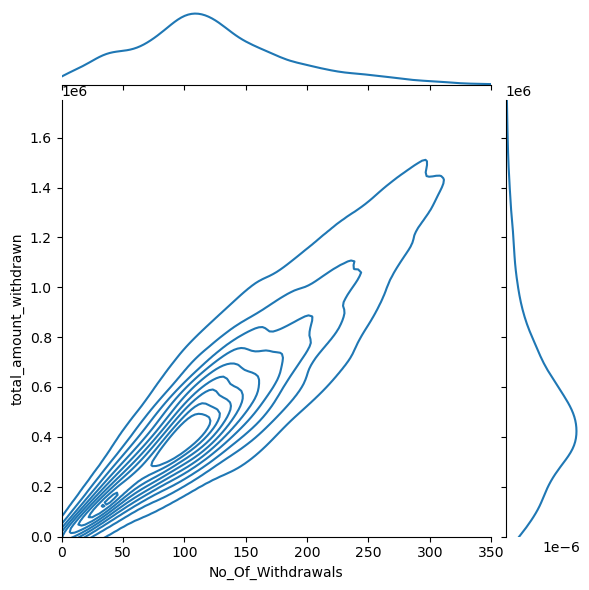

In [52]:
sns.jointplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, 
              kind="kde",
             xlim={0,350}, ylim={0,1750000});

The above graph shows the number of withdrawals distribution across the total amount of withdrawal. We can see that the more transactions starting from around 100 level, the more diferences in the amounts.

Regression plot for XYZ and no XYZ cards and how this relationship varies by the ATM name, working day or weekday.

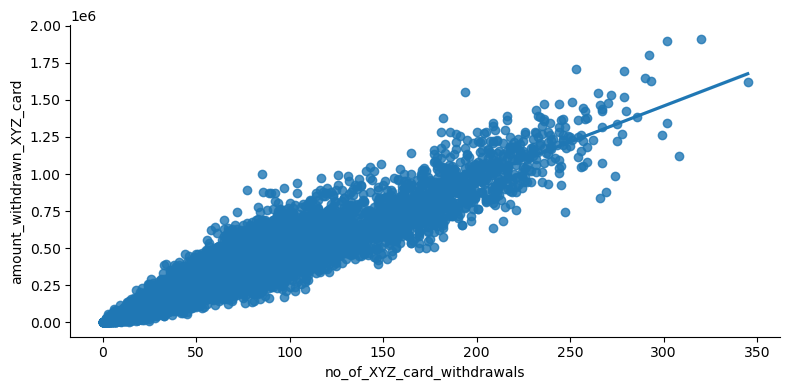

In [42]:
sns.lmplot(x='no_of_XYZ_card_withdrawals', y='amount_withdrawn_XYZ_card', data=atmtrx, height=4, aspect=2);

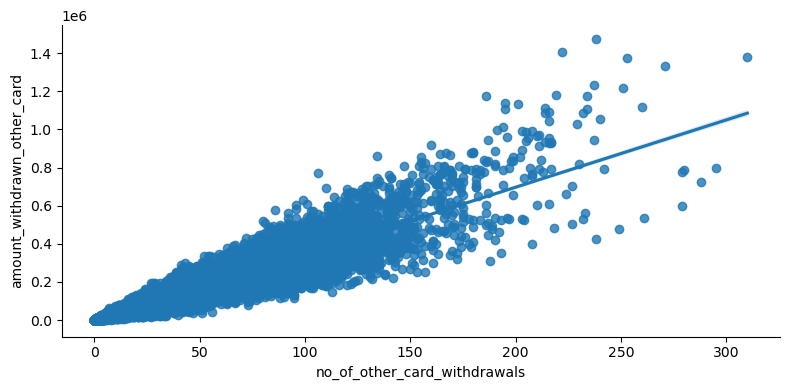

In [43]:
sns.lmplot(x='no_of_other_card_withdrawals', y='amount_withdrawn_other_card', data=atmtrx, height=4, aspect=2);

I can say that,transactions number for XYZ card are slightly better related with XYZ cards amount than for no XYZ cards( more stick to the regression line).

What is relationship between 'No_Of_Withdrawals','total_amount_withdrawn' which varies by the ATM name, working day or weekday?

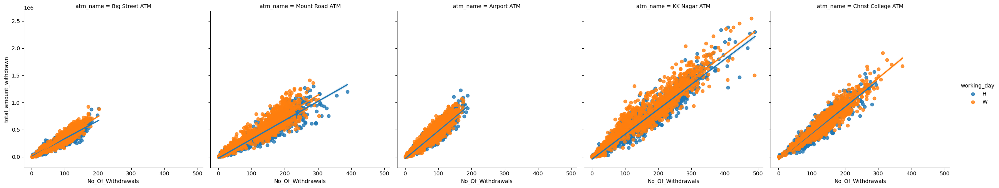

In [44]:
sns.lmplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, col="atm_name", hue="working_day");

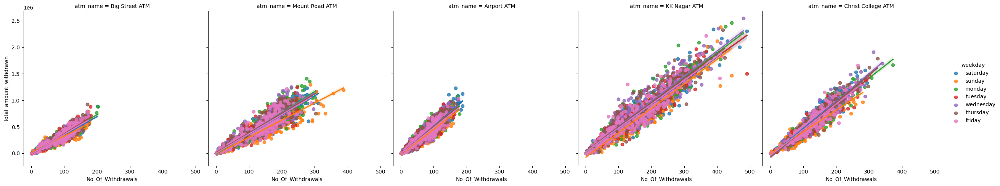

In [55]:
sns.lmplot(x='No_Of_Withdrawals', y='total_amount_withdrawn', data=atmtrx, col="atm_name", hue="weekday");

We can see that ATM 'BIG Street' and Airport ATM has direct relationship and no so much outstanding values, hovever the situation is slightly diffrent for KK Nagar ATM. Bigger transaction numbers varies more for the transaction amount.
The Mount Road ATM has more outstanding values in the weekends. KK Nagar and Christ College ATM both weekend and week.

Interactive Scatterplot by atm_name and weekday

In [48]:
def make_plot(atm_name, weekday):
    fig,ax = plt.subplots()
    a = atmtrx[(atmtrx['atm_name'] == atm_name) & (atmtrx['weekday'] == weekday)]
    b = atmtrx[(atmtrx['atm_name'] == atm_name) & ('all' == weekday)]
    a.plot.scatter(ax=ax,x='No_Of_Withdrawals', y='total_amount_withdrawn', 
                            alpha=.25, color='b')
    b.plot.scatter(ax=ax,x='No_Of_Withdrawals', y='total_amount_withdrawn', 
                            alpha=.25, color='purple')
                        
interact(make_plot, 
         atm_name=['Big Street ATM','Mount Road ATM','Airport ATM','KK Nagar ATM','Christ College ATM'],
         weekday=['friday','monday','saturday','sunday','thursday','tuesday','wednesday','all']
        );

interactive(children=(Dropdown(description='atm_name', options=('Big Street ATM', 'Mount Road ATM', 'Airport A…

Plotting the relationship between no_of_XYZ_withdrawals, no_of_other_card_withdrawals and amount of XYZ and no XYZ card in a matrix with KDE in the principle diagonal colored by atm_name.

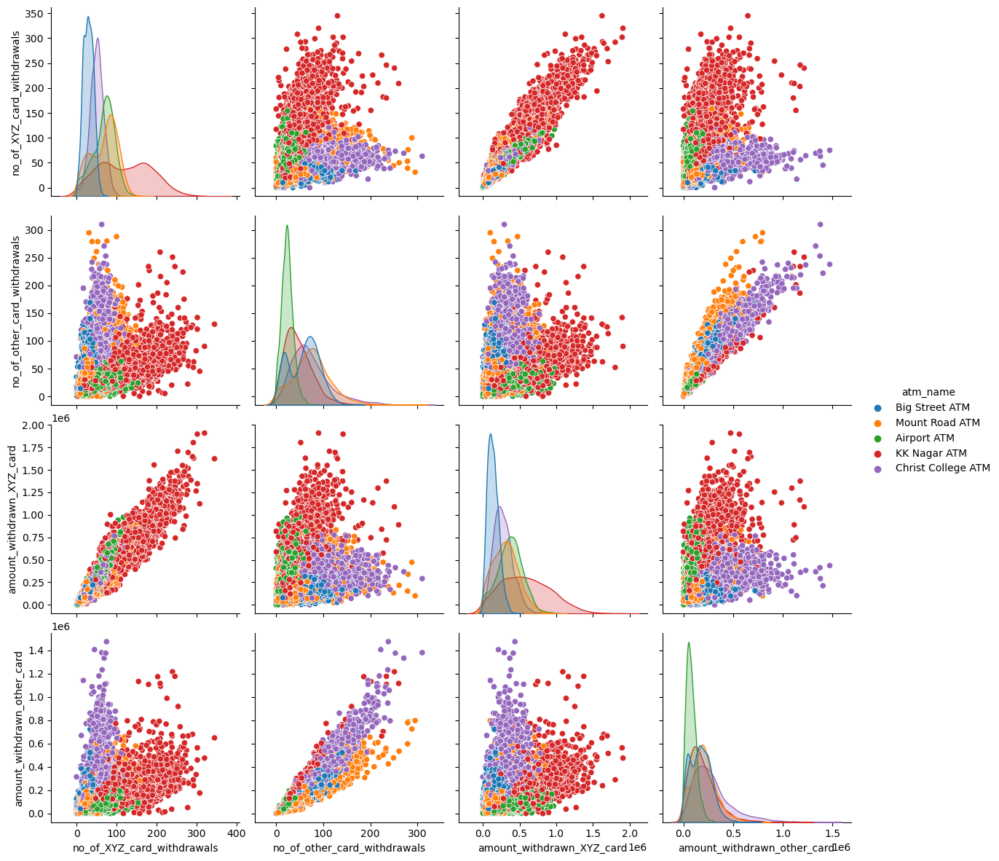

In [57]:
sns.pairplot(atmtrx, height=3,
             vars=["no_of_XYZ_card_withdrawals","no_of_other_card_withdrawals","amount_withdrawn_XYZ_card","amount_withdrawn_other_card"],hue="atm_name");

A closer look for "No_Of_Withdrawals" and "total_amount_withdrawn"

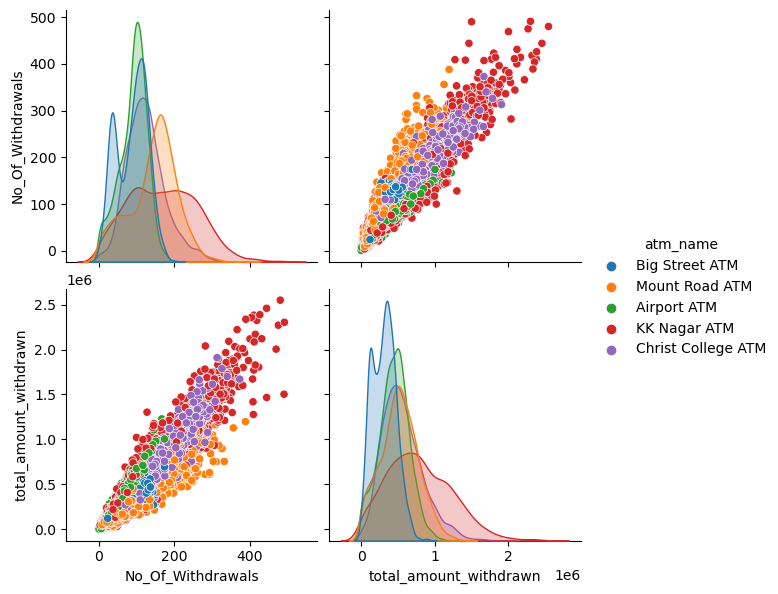

In [54]:
sns.pairplot(atmtrx, height=3,vars=["No_Of_Withdrawals","total_amount_withdrawn"],hue="atm_name");

If we want to see the results according to weekday

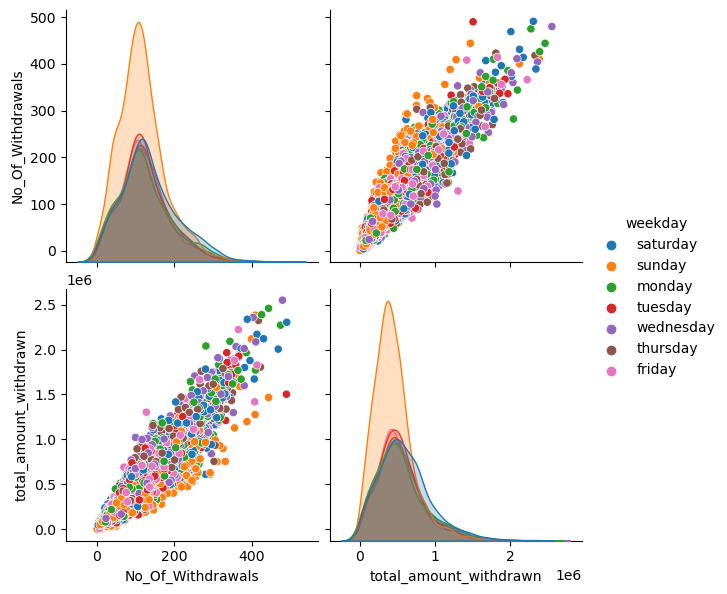

In [56]:
sns.pairplot(atmtrx, height=3,vars=["No_Of_Withdrawals","total_amount_withdrawn"],hue="weekday");

How it looks like for XYZ card and no XYZ cards?

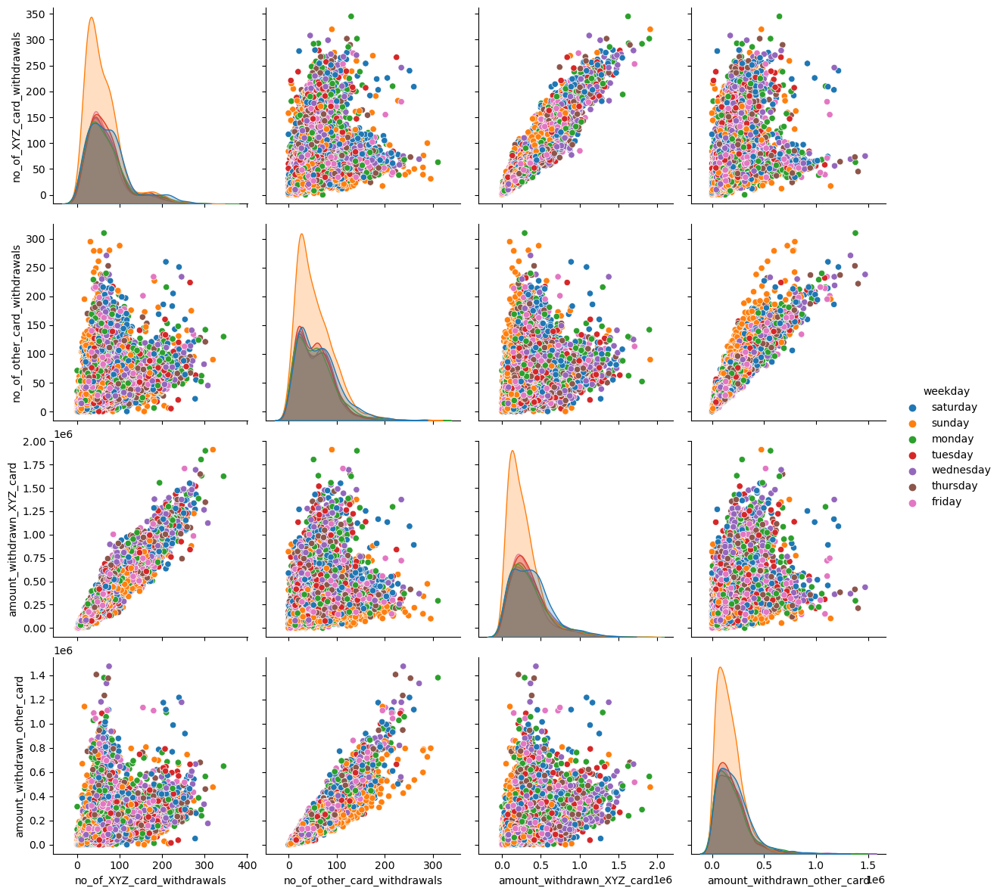

In [58]:
sns.pairplot(atmtrx, height=3,
             vars=["no_of_XYZ_card_withdrawals","no_of_other_card_withdrawals","amount_withdrawn_XYZ_card","amount_withdrawn_other_card"],hue="weekday");

Heatmap

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\2545912196.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



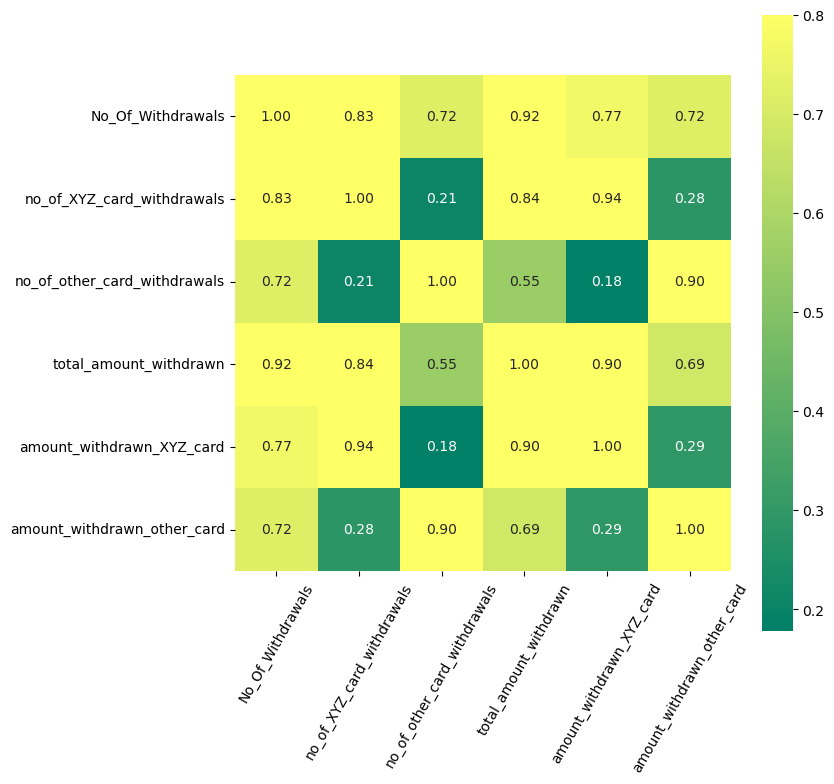

In [59]:
corrmat = atmtrx.corr()
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True, fmt='.2f', cmap = "summer")
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.show()

We can observe strong linear relationship between number of trx and amount of transactions.

Lets calculate correlation coefficent - Parametric correlation analysis

In [60]:
atmtrx.corr()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\2598522904.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals,total_amount_withdrawn,amount_withdrawn_XYZ_card,amount_withdrawn_other_card
No_Of_Withdrawals,1.000000,0.828651,0.718444,0.916664,0.767584,0.719508
no_of_XYZ_card_withdrawals,0.828651,1.000000,0.205975,0.843602,0.936311,0.284056
no_of_other_card_withdrawals,0.718444,0.205975,1.000000,0.554181,0.178363,0.904834
total_amount_withdrawn,0.916664,0.843602,0.554181,1.000000,0.897033,0.686792
amount_withdrawn_XYZ_card,0.767584,0.936311,0.178363,0.897033,1.000000,0.294833
amount_withdrawn_other_card,0.719508,0.284056,0.904834,0.686792,0.294833,1.000000


In [63]:
np.corrcoef(atmtrx['No_Of_Withdrawals'],atmtrx['total_amount_withdrawn'])

array([[1.        , 0.91666396],
       [0.91666396, 1.        ]])

In [64]:
atmtrx['No_Of_Withdrawals'].corr(atmtrx['total_amount_withdrawn'])

0.9166639552419251

Pearson correlation coefficient, use to uncover linear relationship, (R=1 strong positive relationship, R=0 not linearly correlated, R=-1 strong negative relationship)

In [65]:
pearsonr(atmtrx['No_Of_Withdrawals'],atmtrx['total_amount_withdrawn'])

PearsonRResult(statistic=0.9166639552419255, pvalue=0.0)

In [62]:
#Skewness coefficients
#A value of zero is symmetrical distribution,
#A coefficient with a negative value is a left-skewed distribution (long left arm, mean smaller than median)
#A coefficient with a positive value is a right-skewed distribution (long right arm, mean bigger than median)
atmtrx.skew()

C:\Users\karol\AppData\Local\Temp\ipykernel_9640\926796103.py:5: FutureWarning:

The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



No_Of_Withdrawals               0.840089
no_of_XYZ_card_withdrawals      1.482769
no_of_other_card_withdrawals    1.156656
total_amount_withdrawn          1.215551
amount_withdrawn_XYZ_card       1.431214
amount_withdrawn_other_card     1.865879
dtype: float64

Boxplot and outliers analysis

In [66]:
#Boxplots of trx number
atmtrx[['No_Of_Withdrawals', 'no_of_XYZ_card_withdrawals','no_of_other_card_withdrawals']].describe()

,No_Of_Withdrawals,no_of_XYZ_card_withdrawals,no_of_other_card_withdrawals
count,11589.000000,11589.000000,11589.000000
mean,123.341099,67.567694,55.773406
std,67.315288,47.849517,38.506475
min,1.000000,0.000000,0.000000
25%,79.000000,34.000000,25.000000
50%,115.000000,57.000000,50.000000
75%,158.000000,87.000000,78.000000
max,491.000000,345.000000,310.000000


In [67]:
trace0 = go.Box(y = atmtrx['No_Of_Withdrawals'], 
                marker=dict(color='salmon'),
                name = 'No_Of_Withdrawals')

In [68]:
trace1 = go.Box(y = atmtrx['no_of_XYZ_card_withdrawals'], 
                marker=dict(color='indianred'),
                name = 'no_of_XYZ_card_withdrawals')

In [69]:
trace2 = go.Box(y = atmtrx['no_of_other_card_withdrawals'], 
                marker=dict(color='lightsalmon'),
                name = 'no_of_other_card_withdrawals')

In [70]:
data = [trace0, trace1,trace2]

In [71]:
layout = go.Layout(title = "Boxplot")

In [72]:
fig = go.Figure(data = data, 
                layout = layout)

offline.iplot(data)

We can notived present of outliers. The number of trxs for XYZ card are slightly bigger than for no XYZ. 

In [73]:
#Boxplots of trx amount
atmtrx[['total_amount_withdrawn', 'amount_withdrawn_XYZ_card','amount_withdrawn_other_card']].describe()

,total_amount_withdrawn,amount_withdrawn_XYZ_card,amount_withdrawn_other_card
count,1.158900e+04,1.158900e+04,1.158900e+04
mean,5.223059e+05,3.345604e+05,1.877455e+05
std,3.248167e+05,2.470771e+05,1.502351e+05
min,1.000000e+02,0.000000e+00,0.000000e+00
25%,3.057000e+05,1.560000e+05,7.910000e+04
50%,4.700000e+05,2.816000e+05,1.586000e+05
75%,6.716000e+05,4.485000e+05,2.560000e+05
max,2.549800e+06,1.907800e+06,1.472600e+06


In [80]:
trace0 = go.Box(y = atmtrx['total_amount_withdrawn'], 
                marker=dict(color='salmon'),
                name = 'total_amount_withdrawn')

In [81]:
trace1 = go.Box(y = atmtrx['amount_withdrawn_XYZ_card'], 
                marker=dict(color='indianred'),
                name = 'amount_withdrawn_XYZ_card')

In [82]:
trace2 = go.Box(y = atmtrx['amount_withdrawn_other_card'], 
                marker=dict(color='lightsalmon'),
                name = 'amount_withdrawn_other_card')

In [83]:
data = [trace0, trace1,trace2]

In [84]:
layout = go.Layout(title = "Boxplot")

In [85]:
fig = go.Figure(data = data, 
                layout = layout)

offline.iplot(data)

In [87]:
atmtrx_numeric=atmtrx.iloc[:,2:8]

In [88]:
#Extreme value analysis for outliers for atmtrx dataframe numeric variables
#calculation of first and third quartile
q1= atmtrx_numeric.quantile(0.25)
q3=atmtrx_numeric.quantile(0.75)
#inter-quartile range iqr ( spread, the distance between the first and the thierd quartile)
iqr= q3-q1

low_boundary= (q1-1.5*iqr)
upp_boundary=(q3+1.5*iqr)
num_of_outliers_L=(atmtrx[iqr.index]< low_boundary).sum()
num_of_outliers_U=(atmtrx[iqr.index] > upp_boundary).sum()
num_of_outliers_total=num_of_outliers_L+num_of_outliers_U


outliers = pd.DataFrame({'low_boundary':low_boundary, 'upp_boundary':upp_boundary,'num_of_outliers_L':num_of_outliers_L,'num_of_outliers_U':num_of_outliers_U,'num_of_outliers_total':num_of_outliers_total})
print(outliers)

total_atmtrx_numeric=atmtrx_numeric.shape[0]*atmtrx_numeric.shape[1]
print('Total number of outliers in the dataframe are', num_of_outliers_total.sum(),'.')
print('Total number of outliers are', round((num_of_outliers_total.sum()*100)/total_atmtrx_numeric,2) ,'% of all numeric values.')

                              low_boundary  upp_boundary  num_of_outliers_L  \
No_Of_Withdrawals                    -39.5         276.5                  0   
no_of_XYZ_card_withdrawals           -45.5         166.5                  0   
no_of_other_card_withdrawals         -54.5         157.5                  0   
total_amount_withdrawn           -243150.0     1220450.0                  0   
amount_withdrawn_XYZ_card        -282750.0      887250.0                  0   
amount_withdrawn_other_card      -186250.0      521350.0                  0   

                              num_of_outliers_U  num_of_outliers_total  
No_Of_Withdrawals                           329                    329  
no_of_XYZ_card_withdrawals                  678                    678  
no_of_other_card_withdrawals                216                    216  
total_amount_withdrawn                      461                    461  
amount_withdrawn_XYZ_card                   484                    484  
amount_w